# PCD Assignment 01

## Down Sampling and Up Sampling

**Name:** Mazaya Nurina  
**NIM:** 25/554758/PA/23236  
**Course:** Digital Image Processing  
**Assignment:** Down Sampling and Up Sampling


## Introduction

Digital image processing involves processing digital images using computer algorithms. An image can be represented as a two-dimensional function, where the coordinates represent spatial positions and the function value represents image intensity.

Sampling is the process of discretizing the spatial domain of an image into pixels. In this assignment, downsampling is performed to reduce the spatial resolution of an image, while upsampling is performed to increase the spatial resolution using interpolation methods.

The objective of this experiment is to observe and compare the effects of different downsampling and upsampling methods on an image.

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

from google.colab import drive
drive.mount('/content/drive')

folder_path = "/content/drive/MyDrive/PCD_Assignment01"

image_names = [
    "cat.jpg",
    "owl.jpg",
    "gelex.jpg",
    "photostrip.jpg"
]

images = {}

for name in image_names:
    image_path = os.path.join(folder_path, name)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Could not load: {name}")
    else:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        images[name] = image

print("Loaded images:")

for name, image in images.items():
    print(f"{name}: {image.shape[1]} x {image.shape[0]} pixels")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded images:
cat.jpg: 470 x 336 pixels
owl.jpg: 3213 x 5712 pixels
gelex.jpg: 3213 x 5712 pixels
photostrip.jpg: 2268 x 4032 pixels


## Original Images

The four input images are displayed before processing. Each image has different visual characteristics, allowing the effects of downsampling and upsampling to be compared across different types of image content.

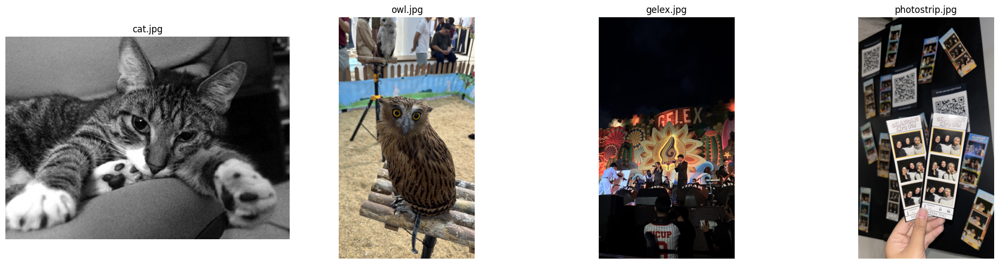

In [21]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for ax, (name, image) in zip(axes, images.items()):
    ax.imshow(image)
    ax.set_title(name)
    ax.axis("off")

plt.tight_layout()
plt.show()

## Downsampling

Downsampling reduces the spatial resolution of an image. In this experiment, the image is reduced by a factor of 2.

Three methods are used:

- **Max:** selects the maximum intensity value from each pixel block.
- **Average:** calculates the mean intensity value from each pixel block.
- **Median:** selects the median intensity value from each pixel block.

The three methods are compared to observe how they affect image brightness, texture, and details.

In [22]:
def downsample(image, factor, method):
    height, width = image.shape[:2]

    new_height = height // factor
    new_width = width // factor

    cropped = image[:new_height * factor, :new_width * factor]

    blocks = cropped.reshape(
        new_height,
        factor,
        new_width,
        factor,
        image.shape[2]
    )

    blocks = blocks.transpose(0, 2, 1, 3, 4)

    if method == "Max":
        result = blocks.max(axis=(2, 3))

    elif method == "Average":
        result = blocks.mean(axis=(2, 3))

    elif method == "Median":
        result = np.median(blocks, axis=(2, 3))

    return result.astype(np.uint8)

### Apply Downsampling

A factor of 2 is used, meaning that each 2 × 2 pixel block is converted into one output pixel.

In [23]:
downsampled = {}

for name, image in images.items():
    downsampled[name] = {
        "Max": downsample(image, 2, "Max"),
        "Average": downsample(image, 2, "Average"),
        "Median": downsample(image, 2, "Median")
    }

for name, results in downsampled.items():
    print(f"\n{name}")
    for method, result in results.items():
        print(f"{method}: {result.shape[1]} x {result.shape[0]} pixels")


cat.jpg
Max: 235 x 168 pixels
Average: 235 x 168 pixels
Median: 235 x 168 pixels

owl.jpg
Max: 1606 x 2856 pixels
Average: 1606 x 2856 pixels
Median: 1606 x 2856 pixels

gelex.jpg
Max: 1606 x 2856 pixels
Average: 1606 x 2856 pixels
Median: 1606 x 2856 pixels

photostrip.jpg
Max: 1134 x 2016 pixels
Average: 1134 x 2016 pixels
Median: 1134 x 2016 pixels


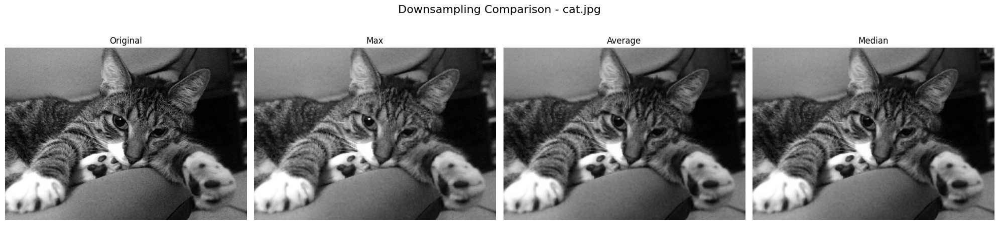

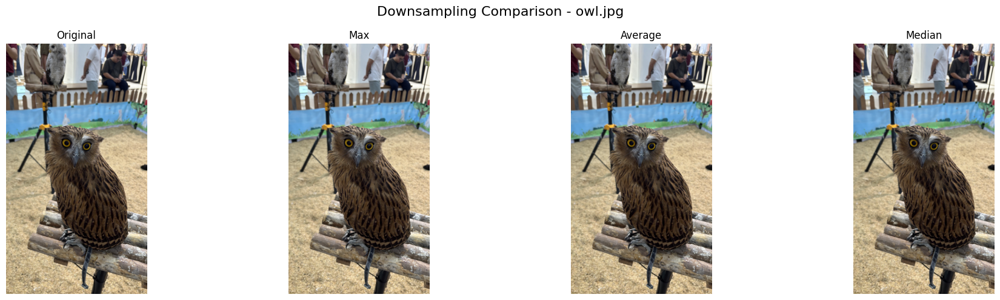

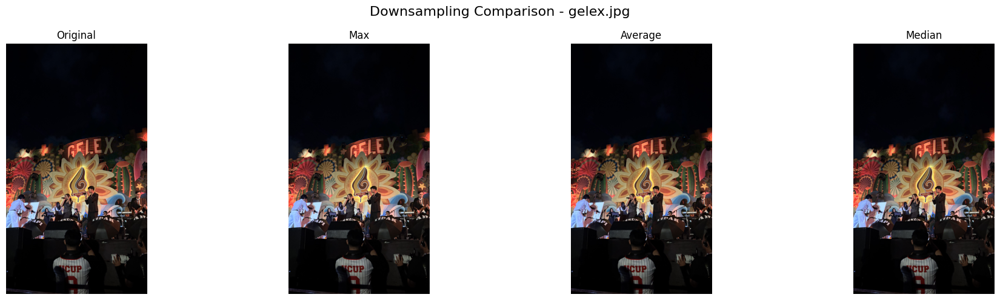

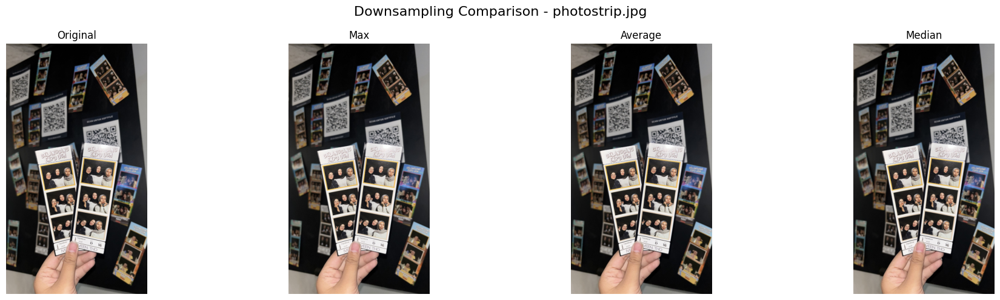

In [24]:
for name, image in images.items():
    results = downsampled[name]

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    axes[0].imshow(image)
    axes[0].set_title("Original")

    axes[1].imshow(results["Max"])
    axes[1].set_title("Max")

    axes[2].imshow(results["Average"])
    axes[2].set_title("Average")

    axes[3].imshow(results["Median"])
    axes[3].set_title("Median")

    for ax in axes:
        ax.axis("off")

    plt.suptitle(f"Downsampling Comparison - {name}", fontsize=16)
    plt.tight_layout()
    plt.show()

## Upsampling

Upsampling increases the spatial resolution of an image. Since new pixels need to be generated, interpolation is used to estimate their values.

Three interpolation methods are used:

- **Nearest Neighbor:** assigns the value of the nearest existing pixel.
- **Bilinear:** calculates new values using neighboring pixels.
- **Bicubic:** uses a larger neighborhood of pixels to calculate new values.

These methods are compared based on image smoothness, sharpness, and preservation of details.

In [25]:
upsampled = {}

for name, image in images.items():
    upsampled[name] = {
        "Nearest Neighbor": cv2.resize(
            image,
            None,
            fx=2,
            fy=2,
            interpolation=cv2.INTER_NEAREST
        ),
        "Bilinear": cv2.resize(
            image,
            None,
            fx=2,
            fy=2,
            interpolation=cv2.INTER_LINEAR
        ),
        "Bicubic": cv2.resize(
            image,
            None,
            fx=2,
            fy=2,
            interpolation=cv2.INTER_CUBIC
        )
    }

for name, results in upsampled.items():
    print(f"\n{name}")
    for method, result in results.items():
        print(f"{method}: {result.shape[1]} x {result.shape[0]} pixels")


cat.jpg
Nearest Neighbor: 940 x 672 pixels
Bilinear: 940 x 672 pixels
Bicubic: 940 x 672 pixels

owl.jpg
Nearest Neighbor: 6426 x 11424 pixels
Bilinear: 6426 x 11424 pixels
Bicubic: 6426 x 11424 pixels

gelex.jpg
Nearest Neighbor: 6426 x 11424 pixels
Bilinear: 6426 x 11424 pixels
Bicubic: 6426 x 11424 pixels

photostrip.jpg
Nearest Neighbor: 4536 x 8064 pixels
Bilinear: 4536 x 8064 pixels
Bicubic: 4536 x 8064 pixels


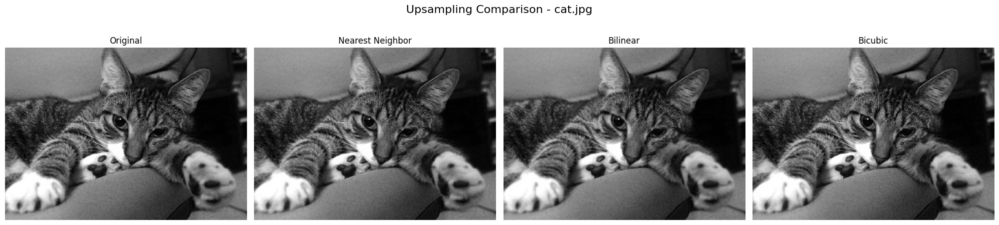

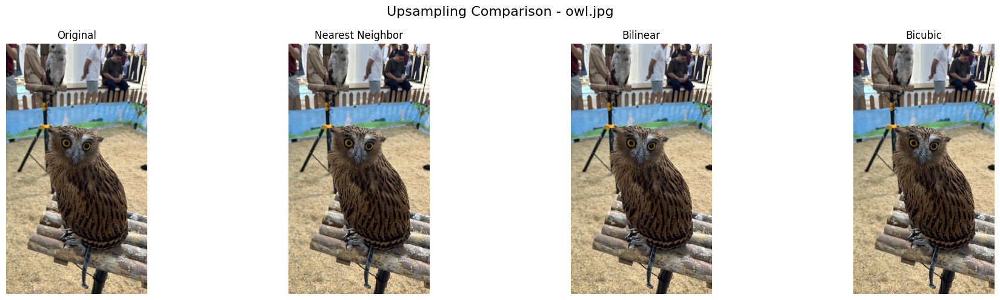

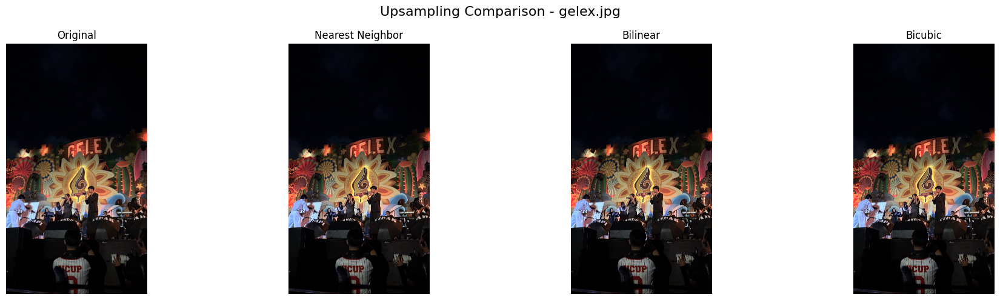

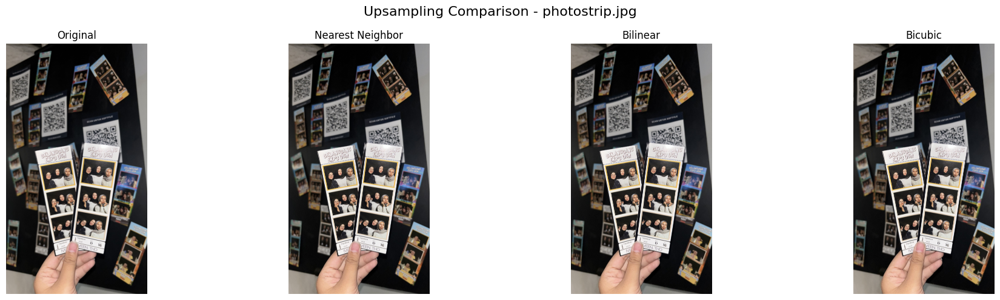

In [26]:
for name, image in images.items():
    results = upsampled[name]

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    axes[0].imshow(image)
    axes[0].set_title("Original")

    axes[1].imshow(results["Nearest Neighbor"])
    axes[1].set_title("Nearest Neighbor")

    axes[2].imshow(results["Bilinear"])
    axes[2].set_title("Bilinear")

    axes[3].imshow(results["Bicubic"])
    axes[3].set_title("Bicubic")

    for ax in axes:
        ax.axis("off")

    plt.suptitle(f"Upsampling Comparison - {name}", fontsize=16)
    plt.tight_layout()
    plt.show()

## Downsampling and Reconstruction

To observe the effect of information loss, the Average downsampled images are enlarged back to their original resolution using Nearest Neighbor, Bilinear, and Bicubic interpolation.

This experiment shows how different interpolation methods reconstruct an image after its spatial resolution has been reduced.

In [27]:
reconstructed = {}

for name, image in images.items():
    average_image = downsampled[name]["Average"]

    reconstructed[name] = {
        "Nearest Neighbor": cv2.resize(
            average_image,
            (image.shape[1], image.shape[0]),
            interpolation=cv2.INTER_NEAREST
        ),
        "Bilinear": cv2.resize(
            average_image,
            (image.shape[1], image.shape[0]),
            interpolation=cv2.INTER_LINEAR
        ),
        "Bicubic": cv2.resize(
            average_image,
            (image.shape[1], image.shape[0]),
            interpolation=cv2.INTER_CUBIC
        )
    }

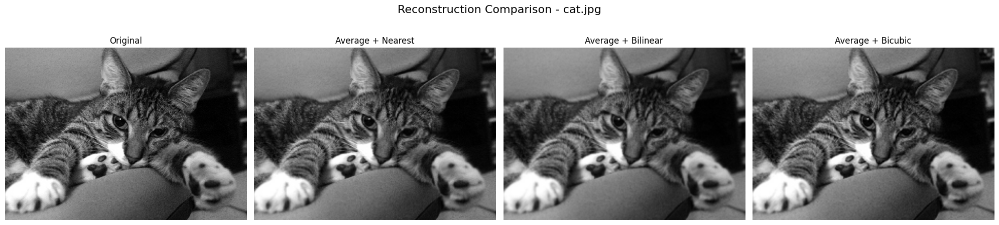

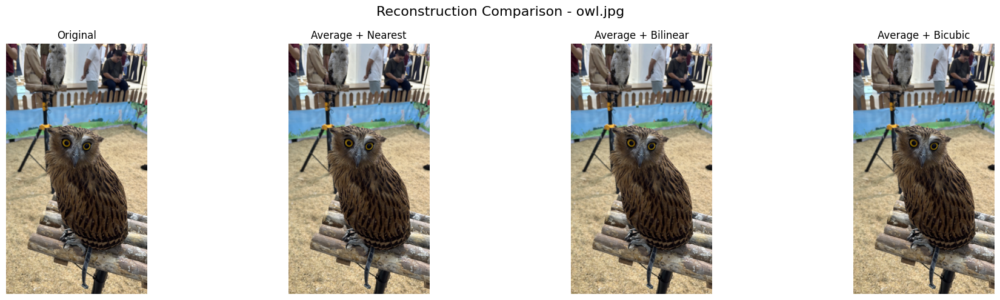

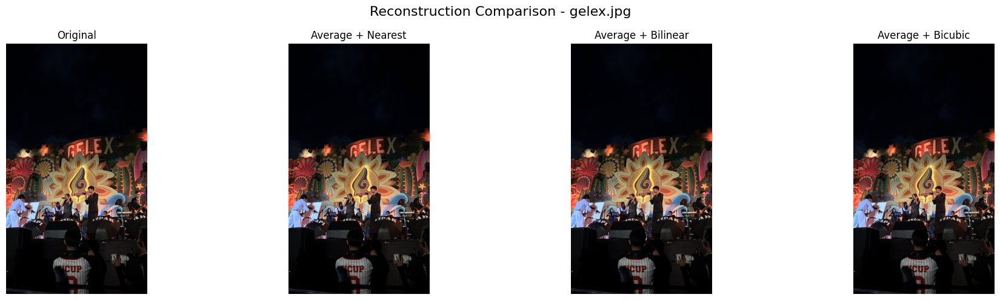

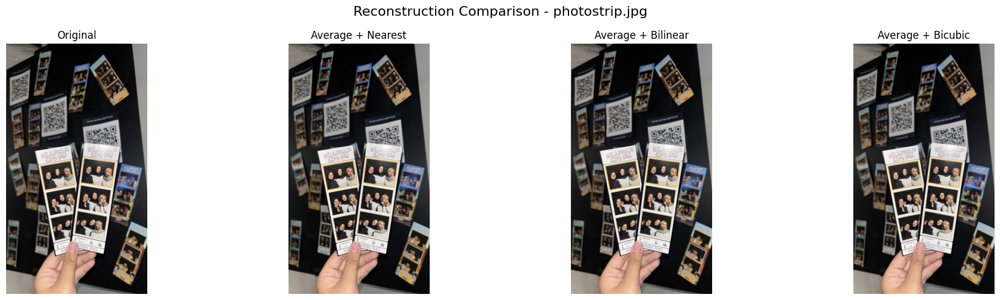

In [28]:
for name, image in images.items():
    results = reconstructed[name]

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    axes[0].imshow(image)
    axes[0].set_title("Original")

    axes[1].imshow(results["Nearest Neighbor"])
    axes[1].set_title("Average + Nearest")

    axes[2].imshow(results["Bilinear"])
    axes[2].set_title("Average + Bilinear")

    axes[3].imshow(results["Bicubic"])
    axes[3].set_title("Average + Bicubic")

    for ax in axes:
        ax.axis("off")

    plt.suptitle(f"Reconstruction Comparison - {name}", fontsize=16)
    plt.tight_layout()
    plt.show()

## Save Results

The processed images are saved in the `results` folder so they can be included in the final GitHub repository.

In [30]:
results_path = os.path.join(folder_path, "results")
os.makedirs(results_path, exist_ok=True)

for name, image in images.items():
    base_name = os.path.splitext(name)[0]

    cv2.imwrite(
        os.path.join(results_path, f"{base_name}_original.png"),
        cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    )

    for method, result in downsampled[name].items():
        cv2.imwrite(
            os.path.join(
                results_path,
                f"{base_name}_downsample_{method.lower()}.png"
            ),
            cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
        )

    for method, result in upsampled[name].items():
        cv2.imwrite(
            os.path.join(
                results_path,
                f"{base_name}_upsample_{method.lower().replace(' ', '_')}.png"
            ),
            cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
        )

    for method, result in reconstructed[name].items():
        cv2.imwrite(
            os.path.join(
                results_path,
                f"{base_name}_reconstructed_{method.lower().replace(' ', '_')}.png"
            ),
            cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
        )

print("All results saved successfully.")
print(results_path)

All results saved successfully.
/content/drive/MyDrive/PCD_Assignment01/results
